In [2]:
import pandas as pd
import numpy as np
import collections
import ast
import time
from tqdm import tqdm
import csv

# Read result

In [3]:
distribution_df = pd.read_csv('../distributions.csv')
display(distribution_df)

,Unnamed: 0,settings,distribution
0,0,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.0, 1.0]}","{'770746': 5, '700758': 13, '846872': 219, '20..."
1,1,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.1, 0.9]}","{'296932': 152, '299125': 59, '282679': 18, '6..."
2,2,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.25, 0.75]}","{'700758': 15, '409784': 37, '296932': 152, '2..."
3,3,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.5, 0.5]}","{'700758': 15, '770746': 2, '409784': 38, '750..."
4,4,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.75, 0.25]}","{'409784': 38, '571475': 63, '185713': 2, '810..."
...,...,...,...
301,301,"{'N': 100, 'k': 50, 'pn': [0.75, 0.25, 0.0, 0.0]}","{'843457': 2, '178777': 10, '810371': 11, '700..."
302,302,"{'N': 100, 'k': 50, 'pn': [0.9, 0.0, 0.0, 0.1]}","{'22170': 2, '745460': 13, '843311': 11, '2776..."
303,303,"{'N': 100, 'k': 50, 'pn': [0.9, 0.0, 0.1, 0.0]}","{'128243': 4, '6847': 22, '278498': 8, '815295..."
304,304,"{'N': 100, 'k': 50, 'pn': [0.9, 0.1, 0.0, 0.0]}","{'342811': 57, '368950': 2, '692648': 14, '414..."


# Create distribution from experiment logs

## Load citations

In [4]:
path = '../data/distribution_merged.csv'
settings_pkl = '../data/settings.pkl'

In [5]:
distribution_df = pd.read_csv(path)

## 1. Join settings

In [6]:
settings = pd.read_pickle(settings_pkl)
print("Liczba wygenerowanych konfiguracji: ", len(settings))

Liczba wygenerowanych konfiguracji:  306


In [7]:
def match_settings(row):
    settings_id = row['settings_id']
    if 0 <= settings_id < len(settings):
        return settings[settings_id]
    return None

distribution_df['settings'] = distribution_df.apply(match_settings, axis=1)

In [8]:
distribution_df = distribution_df.drop('settings_id', axis=1)

In [9]:
display(distribution_df)

,distribution,settings
0,"{'581924': 77, '159651': 434, '759820': 642, '...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.0, 1.0]}"
1,"{'73594': 657, '319876': 57, '174904': 2, '675...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.1, 0.9]}"
2,"{'73594': 653, '319876': 65, '174904': 2, '675...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.25, 0.75]}"
3,"{'319876': 49, '411298': 33, '73594': 529, '38...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.5, 0.5]}"
4,"{'690999': 8, '384533': 35, '182348': 132, '58...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.75, 0.25]}"
...,...,...
301,"{'291602': 45, '154430': 52, '379930': 408, '1...","{'N': 100, 'k': 50, 'pn': [0.75, 0.25, 0.0, 0.0]}"
302,"{'60470': 17, '112413': 287, '137005': 24, '21...","{'N': 100, 'k': 50, 'pn': [0.9, 0.0, 0.0, 0.1]}"
303,"{'251357': 37, '84132': 36, '305185': 5, '4851...","{'N': 100, 'k': 50, 'pn': [0.9, 0.0, 0.1, 0.0]}"
304,"{'32686': 172, '394988': 199, '370491': 6, '57...","{'N': 100, 'k': 50, 'pn': [0.9, 0.1, 0.0, 0.0]}"


## 2. Process citations

In [10]:
def string_to_counter(distribution_str):
    distribution_dict = ast.literal_eval(distribution_str)
    return collections.Counter(distribution_dict)

tqdm.pandas()
distribution_df['distribution'] = distribution_df['distribution'].progress_apply(string_to_counter)

100%|████████████████████████████████████████████████████████████████████████████████| 306/306 [13:22<00:00,  2.62s/it]


In [11]:
display(distribution_df)

,distribution,settings
0,"{'581924': 77, '159651': 434, '759820': 642, '...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.0, 1.0]}"
1,"{'73594': 657, '319876': 57, '174904': 2, '675...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.1, 0.9]}"
2,"{'73594': 653, '319876': 65, '174904': 2, '675...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.25, 0.75]}"
3,"{'319876': 49, '411298': 33, '73594': 529, '38...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.5, 0.5]}"
4,"{'690999': 8, '384533': 35, '182348': 132, '58...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.75, 0.25]}"
...,...,...
301,"{'291602': 45, '154430': 52, '379930': 408, '1...","{'N': 100, 'k': 50, 'pn': [0.75, 0.25, 0.0, 0.0]}"
302,"{'60470': 17, '112413': 287, '137005': 24, '21...","{'N': 100, 'k': 50, 'pn': [0.9, 0.0, 0.0, 0.1]}"
303,"{'251357': 37, '84132': 36, '305185': 5, '4851...","{'N': 100, 'k': 50, 'pn': [0.9, 0.0, 0.1, 0.0]}"
304,"{'32686': 172, '394988': 199, '370491': 6, '57...","{'N': 100, 'k': 50, 'pn': [0.9, 0.1, 0.0, 0.0]}"


## 3. Create distibution
Chnage citations to distibution

In [12]:
def create_citation_distribution(counter):
    # Zliczanie, ile razy każda liczba cytacji występuje (ilosc cytowań, ile prac było tyle razy zacytowanych)
    citation_counts = collections.Counter(counter.values())
    return citation_counts

distribution_df['distribution_citations'] = distribution_df['distribution'].apply(create_citation_distribution)

In [13]:
display(distribution_df)

,distribution,settings,distribution_citations
0,"{'581924': 77, '159651': 434, '759820': 642, '...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.0, 1.0]}","{77: 154, 434: 8, 642: 4, 2: 14147, 41: 333, 6..."
1,"{'73594': 657, '319876': 57, '174904': 2, '675...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.1, 0.9]}","{657: 9, 57: 227, 2: 13482, 4: 5932, 228: 24, ..."
2,"{'73594': 653, '319876': 65, '174904': 2, '675...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.25, 0.75]}","{653: 2, 65: 179, 2: 13387, 5: 4617, 236: 28, ..."
3,"{'319876': 49, '411298': 33, '73594': 529, '38...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.5, 0.5]}","{49: 254, 33: 446, 529: 6, 28: 528, 805: 4, 22..."
4,"{'690999': 8, '384533': 35, '182348': 132, '58...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.75, 0.25]}","{8: 2748, 35: 386, 132: 56, 206: 32, 41: 341, ..."
...,...,...,...
301,"{'291602': 45, '154430': 52, '379930': 408, '1...","{'N': 100, 'k': 50, 'pn': [0.75, 0.25, 0.0, 0.0]}","{45: 1922, 52: 1551, 408: 84, 1: 78882, 346: 1..."
302,"{'60470': 17, '112413': 287, '137005': 24, '21...","{'N': 100, 'k': 50, 'pn': [0.9, 0.0, 0.0, 0.1]}","{17: 5883, 287: 167, 24: 3859, 5: 20134, 420: ..."
303,"{'251357': 37, '84132': 36, '305185': 5, '4851...","{'N': 100, 'k': 50, 'pn': [0.9, 0.0, 0.1, 0.0]}","{37: 2444, 36: 2409, 5: 20399, 457: 88, 118: 5..."
304,"{'32686': 172, '394988': 199, '370491': 6, '57...","{'N': 100, 'k': 50, 'pn': [0.9, 0.1, 0.0, 0.0]}","{172: 338, 199: 265, 6: 17223, 359: 109, 135: ..."


# Compare distributions

## 1. Load source data distribution

In [201]:
import pandas as pd
import collections 

# Wczytanie danych z pliku CSV
articles_df = pd.read_csv('../data/interim/articles_with_score_df.csv')
articles_df['n_citation'] = articles_df['n_citation'].astype(int)

# Grupowanie i liczenie liczby artykułów dla każdej wartości n_citation (ilosc cytowań, ile prac był tyle razy zacytowanych)
source_distribution_citations = collections.Counter(articles_df['n_citation'])
# Wyświetlenie wyników
display(source_distribution_citations)

n_citation
0        143426
1         43825
2         31499
3         25137
4         20640
          ...  
24245         1
26114         1
28679         1
33016         1
42508         1
Name: count, Length: 2402, dtype: int64

Counter({50: 251797,
         0: 143426,
         1: 43825,
         2: 31499,
         3: 25137,
         4: 20640,
         5: 17598,
         6: 15127,
         7: 13268,
         8: 11810,
         9: 10516,
         10: 9591,
         11: 8745,
         12: 7901,
         13: 7463,
         14: 6730,
         15: 6126,
         16: 5811,
         17: 5294,
         18: 4928,
         19: 4651,
         20: 4415,
         21: 4114,
         22: 3979,
         23: 3607,
         24: 3440,
         25: 3364,
         26: 3121,
         51: 2903,
         27: 2893,
         28: 2792,
         52: 2749,
         29: 2667,
         53: 2654,
         30: 2591,
         31: 2418,
         32: 2305,
         54: 2302,
         33: 2208,
         55: 2181,
         63: 2175,
         34: 2100,
         62: 2039,
         35: 2023,
         36: 2017,
         61: 1987,
         64: 1939,
         65: 1895,
         37: 1842,
         38: 1819,
         56: 1788,
         66: 1781,
         

# 1. Load DBLP distribution

In [18]:
import matplotlib.pyplot as plt
import powerlaw
import ast
from scipy.stats import ks_2samp

In [14]:
dblp_df = pd.read_csv('dblp_distribution_citations.csv')

In [16]:
src_dist = dblp_df.iloc[0,0]
src = ast.literal_eval(src_dist)
sorted_keys = sorted(src.keys())
sorted_values = [src[key] for key in tqdm(sorted_keys, desc="Processing keys")]
sorted_values[50] = 3500

Processing keys: 100%|████████████████████████████████████████████████████████| 3217/3217 [00:00<00:00, 3131370.61it/s]


In [19]:
fit = powerlaw.Fit(sorted_values)

Calculating best minimal value for power law fit


In [22]:
distribution_df['sorted_keys'] = distribution_df.distribution_citations.apply(lambda x: sorted(x.keys()))
distribution_df['sorted_values'] = distribution_df[["sorted_keys", "distribution_citations"]].apply(lambda x: [x[1][y] for y in x[0]], axis=1)
distribution_df['powerlaw_fit'] = distribution_df.sorted_values.apply(lambda x: powerlaw.Fit(x))
distribution_df['powerlaw_pval'] = distribution_df.powerlaw_fit.apply(lambda x: x.distribution_compare('power_law', 'exponential')[1])
distribution_df['powerlaw_alpha'] = distribution_df.powerlaw_fit.apply(lambda x: x.alpha)

C:\Users\user\AppData\Local\Temp\ipykernel_10028\2605229278.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  distribution_df['sorted_values'] = distribution_df[["sorted_keys", "distribution_citations"]].apply(lambda x: [x[1][y] for y in x[0]], axis=1)


Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best min

In [23]:
# dopasowanie najbardzije skrajnych i srodkowej wartosci
matching_values = [
    [0.0, 0.0, 0.0, 1.0],
    [0.0, 0.0, 1.0, 0.0],
    [0.0, 1.0, 0.0, 0.0],
    [1.0, 0.0, 0.0, 0.0],
    [0.25, 0.25, 0.25, 0.25]
]

def filter_by_values(settings, values_list):
    pn_values = settings.get('pn')
    return pn_values in values_list

# Zastosuj filtr
filtered_df = distribution_df[distribution_df['settings'].apply(lambda x: filter_by_values(x, matching_values))]

display(filtered_df)

,distribution,settings,distribution_citations,sorted_keys,sorted_values,powerlaw_fit,powerlaw_pval,powerlaw_alpha
0,"{'581924': 77, '159651': 434, '759820': 642, '...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.0, 1.0]}","{77: 154, 434: 8, 642: 4, 2: 14147, 41: 333, 6...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[30601, 14147, 8980, 6480, 4901, 4111, 3406, 2...",<powerlaw.Fit object at 0x000002630E819090>,7.782462e-09,1.685391
6,"{'159651': 393, '203531': 13, '581924': 124, '...","{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 1.0, 0.0]}","{393: 11, 13: 1323, 124: 61, 63: 139, 62: 172,...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[29567, 13076, 8256, 5766, 4381, 3481, 2862, 2...",<powerlaw.Fit object at 0x000002635B0F9550>,7.278598e-05,1.752101
21,"{'772074': 13, '847368': 44, '37516': 59, '828...","{'N': 10, 'k': 10, 'pn': [0.0, 1.0, 0.0, 0.0]}","{13: 1642, 44: 301, 59: 220, 54: 240, 89: 123,...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[36117, 16242, 10116, 7073, 5513, 4339, 3680, ...",<powerlaw.Fit object at 0x000002635B096710>,3.775664e-06,1.702585
30,"{'319876': 143, '675388': 61, '675636': 4, '10...","{'N': 10, 'k': 10, 'pn': [0.25, 0.25, 0.25, 0....","{143: 59, 61: 218, 4: 7910, 457: 9, 25: 806, 3...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[38345, 17575, 11153, 7910, 6033, 4776, 3999, ...",<powerlaw.Fit object at 0x000002635B096D50>,3.009933e-05,1.717782
50,"{'256075': 26, '64255': 12, '112756': 7, '4886...","{'N': 10, 'k': 10, 'pn': [1.0, 0.0, 0.0, 0.0]}","{26: 2841, 12: 7555, 7: 14247, 55: 958, 4: 266...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[98254, 53026, 35755, 26672, 20648, 16846, 142...",<powerlaw.Fit object at 0x000002636D59CBD0>,4.425797e-02,1.898664
51,"{'581924': 203, '159651': 925, '759820': 1278,...","{'N': 10, 'k': 25, 'pn': [0.0, 0.0, 0.0, 1.0]}","{203: 80, 925: 8, 1278: 3, 4: 7351, 93: 176, 1...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[31111, 15638, 10320, 7351, 5904, 4783, 4064, ...",<powerlaw.Fit object at 0x000002636D59FA90>,1.002418e-07,1.728623
57,"{'159651': 1139, '203531': 62, '581924': 393, ...","{'N': 10, 'k': 25, 'pn': [0.0, 0.0, 1.0, 0.0]}","{1139: 4, 62: 262, 393: 15, 103: 137, 101: 162...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[30104, 15044, 9711, 7118, 5494, 4459, 3762, 3...",<powerlaw.Fit object at 0x000002636D59ED10>,5.558506e-10,1.760159
72,"{'772074': 47, '847368': 72, '37516': 198, '82...","{'N': 10, 'k': 25, 'pn': [0.0, 1.0, 0.0, 0.0]}","{47: 482, 72: 266, 198: 81, 75: 252, 166: 79, ...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[37062, 17902, 11977, 8558, 6653, 5549, 4559, ...",<powerlaw.Fit object at 0x000002635B11F7D0>,2.806019e-12,1.705101
81,"{'319876': 273, '675388': 219, '675636': 5, '1...","{'N': 10, 'k': 25, 'pn': [0.25, 0.25, 0.25, 0....","{273: 43, 219: 66, 5: 7267, 831: 7, 41: 630, 7...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[39005, 19804, 12940, 9462, 7267, 6000, 4889, ...",<powerlaw.Fit object at 0x000002632BE38850>,7.314362e-10,1.694154
101,"{'256075': 55, '64255': 27, '112756': 17, '488...","{'N': 10, 'k': 25, 'pn': [1.0, 0.0, 0.0, 0.0]}","{55: 1409, 27: 3358, 17: 5785, 142: 381, 7: 15...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","[81102, 49868, 35148, 26920, 21471, 18202, 153...",<powerlaw.Fit object at 0x000002635B0978D0>,2.196569e-03,1.848572


In [24]:
def pdf_plot(fit_exp, fit, title):
    plt.figure(figsize=(10, 6))
    
    fit.plot_pdf(color='blue', label='Empirical Fit', linestyle='-', linewidth=2)
    fit_exp.plot_pdf(color='red', label='Experimental Fit', linestyle='--', linewidth=2)
    
    plt.xlabel('Value')
    plt.ylabel('Probability Density')
    # plt.legend(loc='lower right')
    plt.title(f'Power Law Fits of Two Datasets {title}')
    plt.legend()
    plt.show()

In [35]:
def pdf_cdf_plot(fit_exp, fit, title, index):
    fig, axs = plt.subplots(1, 2, figsize=(15, 6))  # Tworzy dwa wykresy obok siebie

    # Wykres PDF
    fit.plot_pdf(color='blue', label='Empirical Fit', linestyle='-', linewidth=2, ax=axs[0])
    fit_exp.plot_pdf(color='red', label='Experimental Fit', linestyle='--', linewidth=2, ax=axs[0])
    axs[0].set_xlabel('Value')
    axs[0].set_ylabel('Probability Density')
    axs[0].set_title(f'PDF Comparison {title}')
    axs[0].legend()

    # Wykres CDF
    fit.plot_cdf(color='blue', label='Empirical Fit', linestyle='-', linewidth=2, ax=axs[1])
    fit_exp.plot_cdf(color='red', label='Experimental Fit', linestyle='--', linewidth=2, ax=axs[1])
    axs[1].set_xlabel('Value')
    axs[1].set_ylabel('Cumulative Probability')
    axs[1].set_title(f'CDF Comparison {title}')
    axs[1].legend()

    plt.tight_layout()  # Automatycznie dostosowuje rozmieszczenie
    plt.savefig(f'../plot/pdf_cdf_plot_{index}.png', bbox_inches='tight')


C:\Users\user\AppData\Local\Temp\ipykernel_10028\3922388475.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2, figsize=(15, 6))  # Tworzy dwa wykresy obok siebie


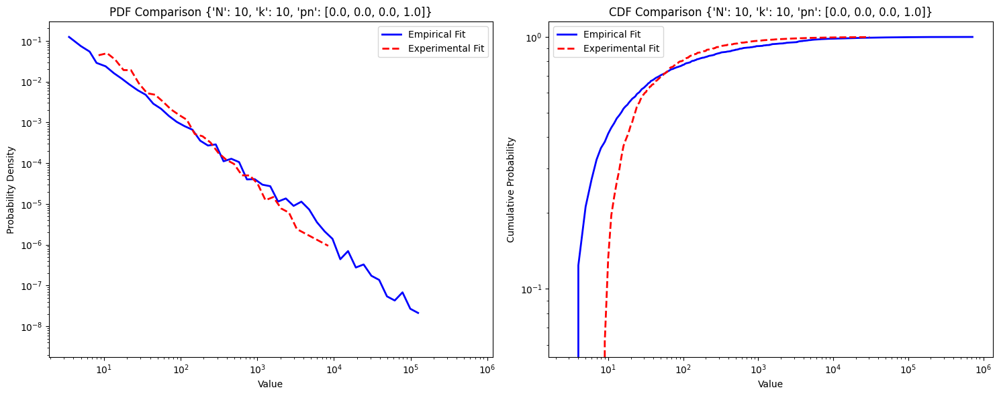

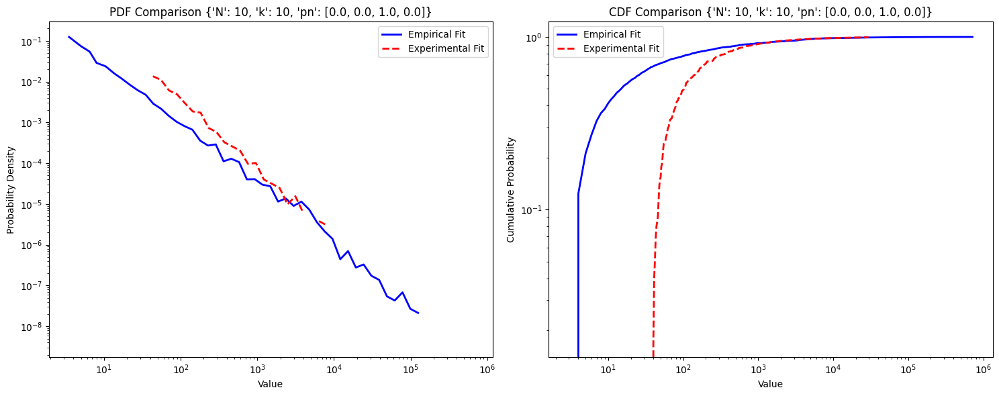

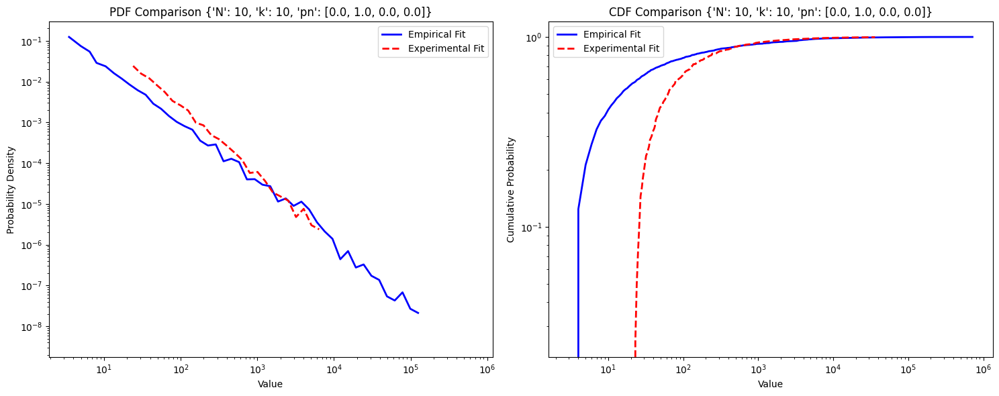

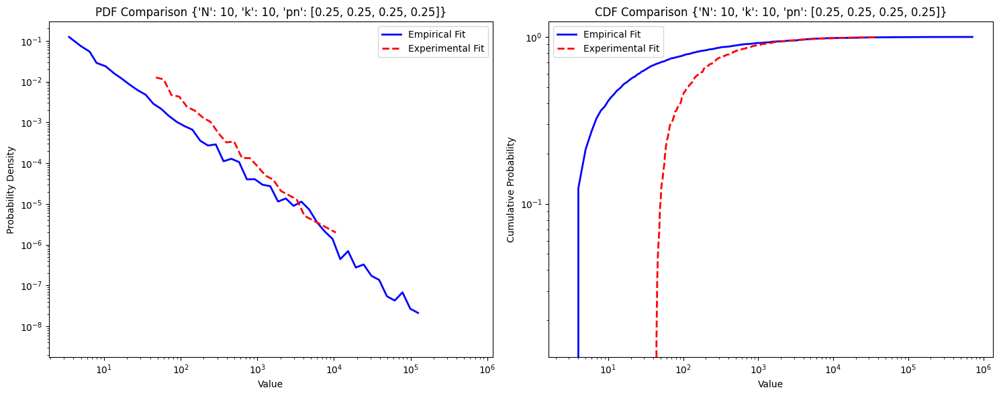

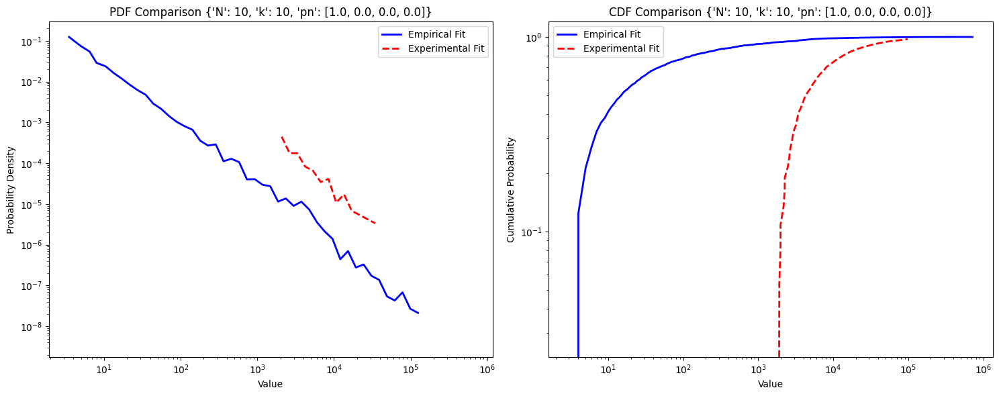

...

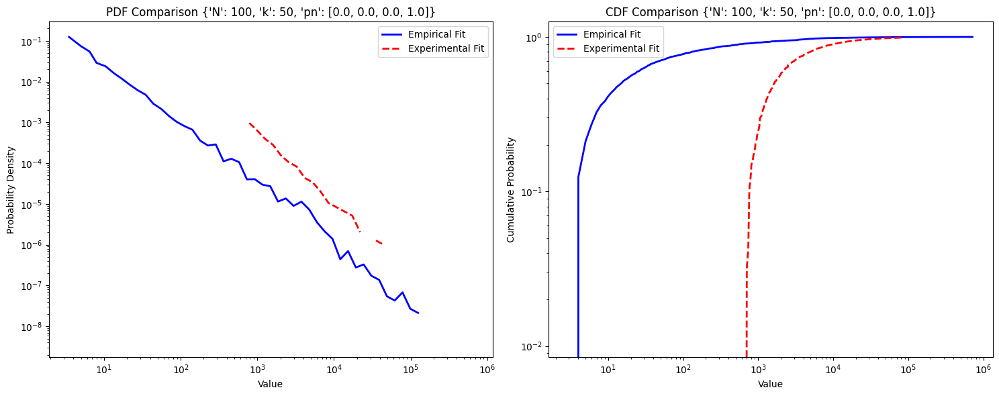

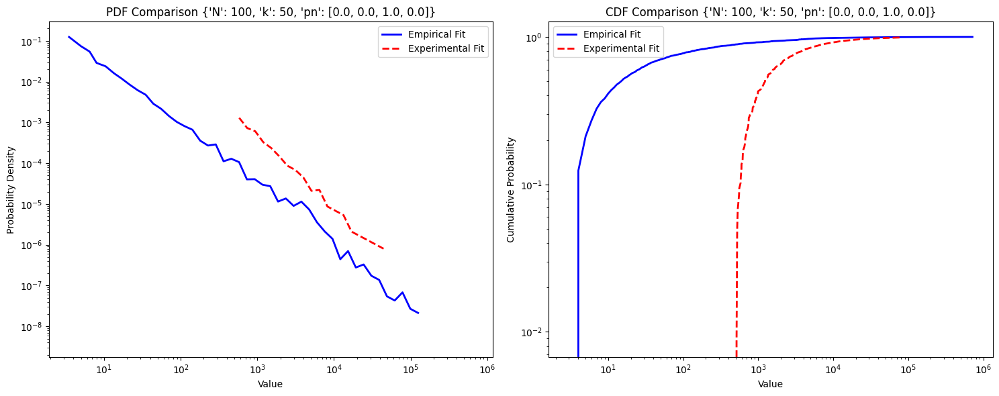

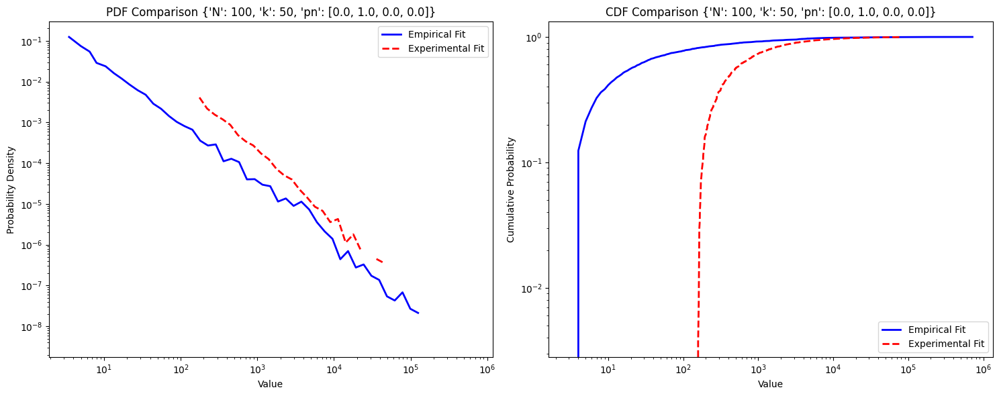

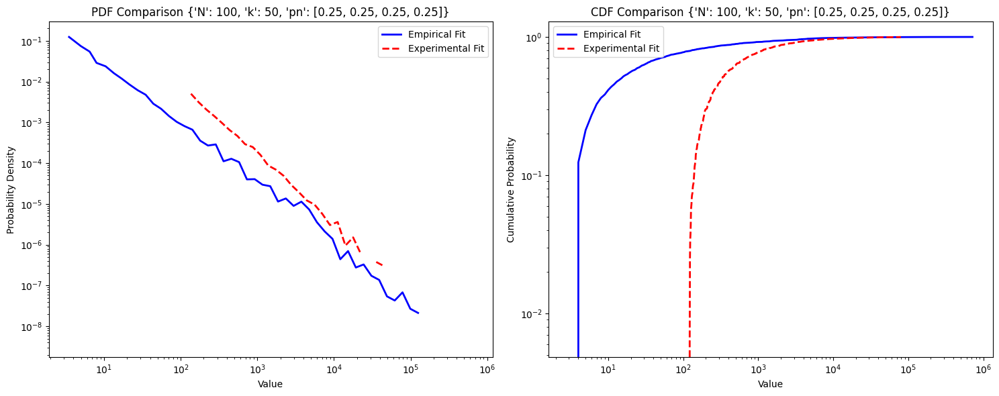

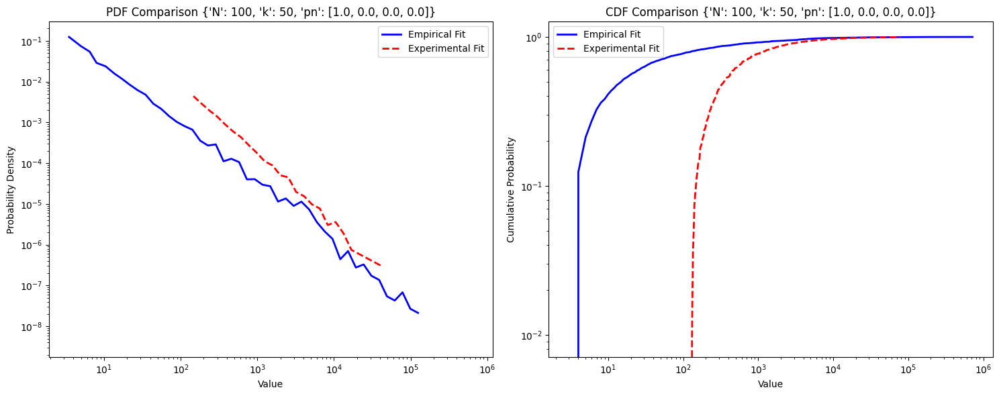

In [36]:
for index, row in filtered_df.iterrows():
    # Wyciąganie wartości distribution_citations
    dist_citations_values = list(row['distribution_citations'].values())
    fit_exp = row['powerlaw_fit']
    # Wywołanie funkcji plot_cdf z wyodrębnionymi wartościami
    pdf_cdf_plot(fit_exp, fit, str(row['settings']), index)

## 2. KS distribution test 

In [221]:
import scipy.stats as stats

distribution_df['KS Statistic'] = None
distribution_df['P-value'] = None

for index, row in tqdm(distribution_df.iterrows(), total=len(distribution_df), desc="KS Statistic"):
    dist_citations_values = list(row['distribution_citations'].values())
    src_citations_values = list(source_distribution_citations.values())
    
    # Obliczamy statystyki KS oraz p-wartość
    ks_statistic, p_value = stats.ks_2samp(dist_citations_values, src_citations_values)
    
    # Dodajemy wyniki do odpowiednich kolumn
    distribution_df.at[index, 'KS Statistic'] = ks_statistic
    distribution_df.at[index, 'P-value'] = p_value

display(distribution_df)

KS Statistic: 100%|█████████████████████████████████████████████████████████████████| 306/306 [00:02<00:00, 137.07it/s]


,distribution,most_common,unique_keys_count,settings,distribution_citations,KS Statistic,P-value
0,"{'581924': 77, '159651': 434, '759820': 642, '...",{'213826': 13138},130648,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.0, 1.0]}","{77: 154, 434: 8, 642: 4, 2: 14147, 41: 333, 6...",0.069587,0.00004
1,"{'73594': 657, '319876': 57, '174904': 2, '675...",{'407739': 14744},123165,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.1, 0.9]}","{657: 9, 57: 227, 2: 13482, 4: 5932, 228: 24, ...",0.074224,0.000008
2,"{'73594': 653, '319876': 65, '174904': 2, '675...",{'407739': 14657},123403,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.25, 0.75]}","{653: 2, 65: 179, 2: 13387, 5: 4617, 236: 28, ...",0.07253,0.000015
3,"{'319876': 49, '411298': 33, '73594': 529, '38...",{'407739': 15145},123629,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.5, 0.5]}","{49: 254, 33: 446, 529: 6, 28: 528, 805: 4, 22...",0.071725,0.000019
4,"{'690999': 8, '384533': 35, '182348': 132, '58...",{'407739': 13217},124315,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.75, 0.25]}","{8: 2748, 35: 386, 132: 56, 206: 32, 41: 341, ...",0.074713,0.000006
...,...,...,...,...,...,...,...
301,"{'291602': 45, '154430': 52, '379930': 408, '1...",{'806988': 5889},566687,"{'N': 100, 'k': 50, 'pn': [0.75, 0.25, 0.0, 0.0]}","{45: 1922, 52: 1551, 408: 84, 1: 78882, 346: 1...",0.150248,0.0
302,"{'60470': 17, '112413': 287, '137005': 24, '21...",{'213826': 6405},566278,"{'N': 100, 'k': 50, 'pn': [0.9, 0.0, 0.0, 0.1]}","{17: 5883, 287: 167, 24: 3859, 5: 20134, 420: ...",0.17236,0.0
303,"{'251357': 37, '84132': 36, '305185': 5, '4851...",{'326051': 5272},573232,"{'N': 100, 'k': 50, 'pn': [0.9, 0.0, 0.1, 0.0]}","{37: 2444, 36: 2409, 5: 20399, 457: 88, 118: 5...",0.173015,0.0
304,"{'32686': 172, '394988': 199, '370491': 6, '57...",{'806988': 4759},573141,"{'N': 100, 'k': 50, 'pn': [0.9, 0.1, 0.0, 0.0]}","{172: 338, 199: 265, 6: 17223, 359: 109, 135: ...",0.158152,0.0


## 3. Filter results

## Lista pierwszych 15 wyniów z największą różnicą zbioru

In [242]:
# Konwersja kolumny 'KS Statistic' na typ float
distribution_df['KS Statistic'] = pd.to_numeric(distribution_df['KS Statistic'], errors='coerce')

# Wyświetlenie pierwszych 15 największych wartości w kolumnie 'KS Statistic'
top_15_ks = distribution_df.nlargest(15, 'KS Statistic')

# Wyświetlenie wyników
display(top_15_ks[['KS Statistic', 'P-value', 'settings']])


,KS Statistic,P-value,settings
50,0.303031,0.0,"{'N': 10, 'k': 10, 'pn': [1.0, 0.0, 0.0, 0.0]}"
201,0.247690,0.0,"{'N': 100, 'k': 10, 'pn': [0.9, 0.0, 0.1, 0.0]}"
203,0.238299,0.0,"{'N': 100, 'k': 10, 'pn': [1.0, 0.0, 0.0, 0.0]}"
101,0.234638,0.0,"{'N': 10, 'k': 25, 'pn': [1.0, 0.0, 0.0, 0.0]}"
202,0.232610,0.0,"{'N': 100, 'k': 10, 'pn': [0.9, 0.1, 0.0, 0.0]}"
200,0.211262,0.0,"{'N': 100, 'k': 10, 'pn': [0.9, 0.0, 0.0, 0.1]}"
198,0.209787,0.0,"{'N': 100, 'k': 10, 'pn': [0.75, 0.0, 0.25, 0.0]}"
196,0.205279,0.0,"{'N': 100, 'k': 10, 'pn': [0.5, 0.5, 0.0, 0.0]}"
194,0.205129,0.0,"{'N': 100, 'k': 10, 'pn': [0.5, 0.25, 0.0, 0.25]}"
199,0.204702,0.0,"{'N': 100, 'k': 10, 'pn': [0.75, 0.25, 0.0, 0.0]}"


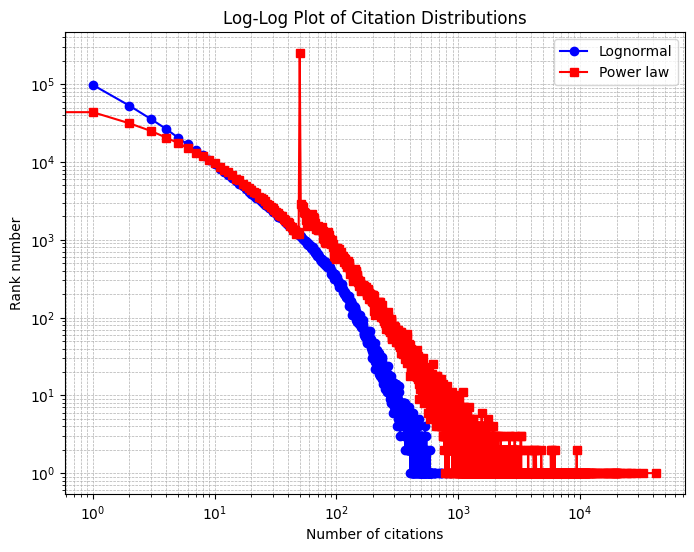

In [269]:
# def plot_cdf(dist_citations_values, src_citations_values):
#     # Sortowanie wartości
#     dist_sorted = np.sort(dist_citations_values)
#     src_sorted = np.sort(src_citations_values)
    
#     # Obliczanie funkcji dystrybuanty
#     dist_cdf = np.arange(1, len(dist_sorted) + 1) / len(dist_sorted)
#     src_cdf = np.arange(1, len(src_sorted) + 1) / len(src_sorted)
    
#     plt.figure(figsize=(14, 6))
    
#     plt.plot(dist_sorted, dist_cdf, marker='.', linestyle='none', label='Distribution CDF', color='blue')
#     plt.plot(src_sorted, src_cdf, marker='.', linestyle='none', label='Source Distribution CDF', color='green')
    
#     plt.xlabel('Number of Citations')
#     plt.ylabel('CDF')
#     plt.title('CDF of Citation Distributions')
#     plt.legend(loc='lower right')
#     plt.grid(True)
#     #plt.show()
#     plt.savefig('cdf_plot.png')
# # Przyklad wywołania funkcji
# plot_cdf(list(top_15_ks.iloc[96]['distribution_citations'].values()), list(source_distribution_citations.values()))


def log_plot(distribution_citations, source_distribution_list):
    # Tworzenie dataframe'ów z danych
    distribution_df = pd.DataFrame(list(distribution_citations.items()), columns=['Citations', 'Count'])
    source_distribution_df = pd.DataFrame(source_distribution_list, columns=['Citations', 'Count'])
    
    # Sortowanie danych według liczby cytowań
    distribution_df = distribution_df.sort_values(by='Citations', ascending=True)
    source_distribution_df = source_distribution_df.sort_values(by='Citations', ascending=True)
    
    # Wykres log-log
    plt.figure(figsize=(8, 6))
    plt.loglog(distribution_df['Citations'], distribution_df['Count'], marker='o', linestyle='-', color='blue', label='Lognormal')
    plt.loglog(source_distribution_df['Citations'], source_distribution_df['Count'], marker='s', linestyle='-', color='red', label='Power law')
    
    plt.xlabel('Number of citations')
    plt.ylabel('Rank number')
    plt.title('Log-Log Plot of Citation Distributions')
    plt.legend()
    plt.grid(True, which="both", ls="--", linewidth=0.5)
    plt.show()

log_plot(top_15_ks.iloc[0]['distribution_citations'], list(source_distribution_citations.items()))

In [316]:
filtered_df = distribution_df[distribution_df['P-value'] > 0.05]
display(filtered_df)

,distribution,most_common,unique_keys_count,settings,distribution_citations,KS Statistic,P-value,distribution_citations_csv
31,"{'323973': 19, '373357': 57, '828119': 37, '48...",{'634952': 10890},212536,"{'N': 10, 'k': 10, 'pn': [0.25, 0.25, 0.5, 0.0]}","{19: 1555, 57: 328, 37: 599, 580: 8, 73: 215, ...",0.041447,0.05759,"{19: 1555, 57: 328, 37: 599, 580: 8, 73: 215, ..."
48,"{'64255': 11, '488673': 54, '256075': 24, '323...",{'74260': 4413},415296,"{'N': 10, 'k': 10, 'pn': [0.9, 0.0, 0.1, 0.0]}","{11: 7415, 54: 665, 24: 2578, 58: 627, 13: 589...",0.042796,0.097157,"{11: 7415, 54: 665, 24: 2578, 58: 627, 13: 589..."
96,"{'690999': 82, '235333': 80, '485173': 1085, '...",{'326051': 13037},453332,"{'N': 10, 'k': 25, 'pn': [0.75, 0.0, 0.25, 0.0]}","{82: 531, 80: 514, 1085: 2, 228: 101, 103: 356...",0.018819,0.77264,"{82: 531, 80: 514, 1085: 2, 228: 101, 103: 356..."


In [238]:
display(distribution_df.loc[96])

distribution              {'690999': 82, '235333': 80, '485173': 1085, '...
most_common                                               {'326051': 13037}
unique_keys_count                                                    453332
settings                   {'N': 10, 'k': 25, 'pn': [0.75, 0.0, 0.25, 0.0]}
distribution_citations    {82: 531, 80: 514, 1085: 2, 228: 101, 103: 356...
KS Statistic                                                       0.018819
P-value                                                             0.77264
Name: 96, dtype: object

## WYSWIETLANIE ROZKŁADÓW

In [295]:
def zipf_plot(distribution_citations_list, source_distribution_list, settings):
    # Tworzenie dataframe'ów z danych
    distribution_df = pd.DataFrame(distribution_citations_list, columns=['Citations', 'Count'])
    source_distribution_df = pd.DataFrame(source_distribution_list, columns=['Citations', 'Count'])
    
    # Sortowanie danych według liczby cytowań
    distribution_df = distribution_df.sort_values(by='Citations', ascending=True)
    source_distribution_df = source_distribution_df.sort_values(by='Citations', ascending=True)
    
    # Wykres log-log
    plt.figure(figsize=(60, 6))
    plt.loglog(distribution_df['Citations'], distribution_df['Count'], 
               marker='o', linestyle='-', color='blue', 
               linewidth=0.5,  # Ustawienie grubości linii
               markersize=1,    # Rozmiar kropek
               label='Lognormal')
    plt.loglog(source_distribution_df['Citations'], source_distribution_df['Count'], 
               marker='s', linestyle='-', color='red', 
               linewidth=0.5,  # Ustawienie grubości linii
               markersize=1,    # Rozmiar kropek
               label='Power law')

    plt.xlabel('Number of citations')
    plt.ylabel('Rank number')
    plt.title(f'Log-Log Plot of Citation Distributions: {settings}')
    plt.legend()
    plt.grid(True, which="both", ls="--", linewidth=0.5)
    #plt.show()
    plt.savefig('zipf_plot.svg')

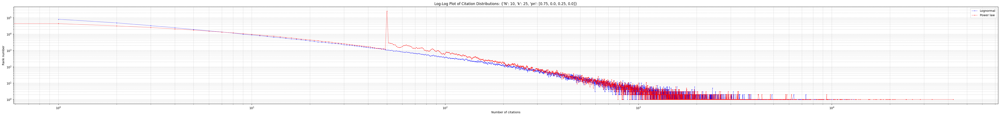

In [296]:
zipf_plot(list(distribution_df.iloc[96]['distribution_citations'].items()), list(source_distribution_citations.items()), str(distribution_df.iloc[96]['settings']))

In [304]:
with PdfPages('../zipf_plots_best.pdf') as pdf_pages:
    zipf_plot(list(distribution_df.iloc[96]['distribution_citations'].items()), 
              list(source_distribution_citations.items()), 
              str(distribution_df.iloc[96]['settings']),
              pdf_pages)

In [284]:
import numpy as np

def plot_cdf(dist_citations_values, src_citations_values):
    # Sortowanie wartości
    dist_sorted = np.sort(dist_citations_values)
    src_sorted = np.sort(src_citations_values)
    
    # Obliczanie funkcji dystrybuanty
    dist_cdf = np.arange(1, len(dist_sorted) + 1) / len(dist_sorted)
    src_cdf = np.arange(1, len(src_sorted) + 1) / len(src_sorted)
    
    plt.figure(figsize=(14, 6))
    
    plt.plot(dist_sorted, dist_cdf, marker='.', linestyle='none', label='Distribution CDF', color='blue')
    plt.plot(src_sorted, src_cdf, marker='.', linestyle='none', label='Source Distribution CDF', color='green')
    
    plt.xlabel('Number of Citations')
    plt.ylabel('CDF')
    plt.title('CDF of Citation Distributions')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

# Przyklad wywołania funkcji
plot_cdf(distribution_citations_values, source_distribution_citations_values)


NameError: name 'distribution_citations_values' is not defined

In [ ]:
plt.savefig('cdf_plot.png')

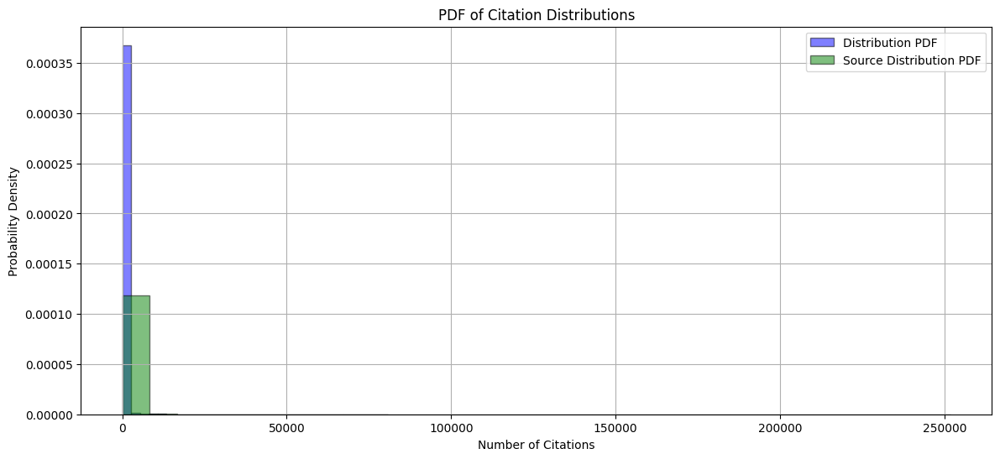

In [229]:
def plot_pdf(dist_citations_values, src_citations_values):
    plt.figure(figsize=(14, 6))
    
    plt.hist(dist_citations_values, bins=30, density=True, alpha=0.5, label='Distribution PDF', color='blue', edgecolor='black')
    plt.hist(src_citations_values, bins=30, density=True, alpha=0.5, label='Source Distribution PDF', color='green', edgecolor='black')
    
    plt.xlabel('Number of Citations')
    plt.ylabel('Probability Density')
    plt.title('PDF of Citation Distributions')
    plt.legend(loc='upper right')
    plt.grid(True)
    #plt.show()
    plt.savefig('pdf_plot.png')
# Przyklad wywołania funkcji
plot_pdf(list(distribution_df.iloc[96]['distribution_citations'].values()), list(source_distribution_citations.values()))

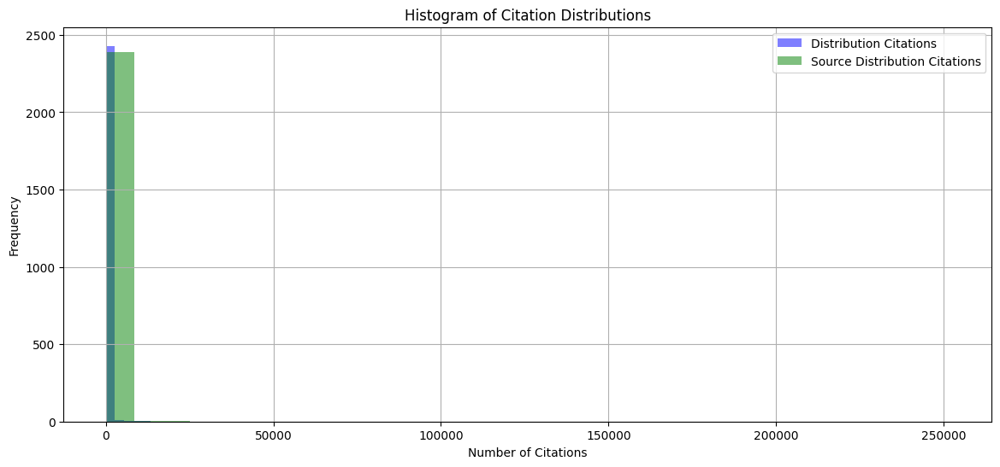

In [239]:
import matplotlib.pyplot as plt

def plot_histograms(dist_citations_values, src_citations_values):
    plt.figure(figsize=(14, 6))
    
    plt.hist(dist_citations_values, bins=30, alpha=0.5, label='Distribution Citations', color='blue')
    plt.hist(src_citations_values, bins=30, alpha=0.5, label='Source Distribution Citations', color='green')
    
    plt.xlabel('Number of Citations')
    plt.ylabel('Frequency')
    plt.title('Histogram of Citation Distributions')
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.show()

plot_histograms(list(distribution_df.iloc[96]['distribution_citations'].values()), list(source_distribution_citations.values()))


In [ ]:
distribution_df = distribution_df[distribution_df['

In [232]:
combinations = [[1, 0, 0, 0], [0, 1, 0, 0], [0, 0, 1, 0], [0, 0, 0, 1]]

# Filtrowanie wierszy, które spełniają warunki
filtered_df = distribution_df[distribution_df['settings'].apply(lambda x: x['pn'] in combinations)]

display(filtered_df)

,distribution,most_common,unique_keys_count,settings,distribution_citations,KS Statistic,P-value
0,"{'581924': 77, '159651': 434, '759820': 642, '...",{'213826': 13138},130648,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 0.0, 1.0]}","{77: 154, 434: 8, 642: 4, 2: 14147, 41: 333, 6...",0.069587,0.00004
6,"{'159651': 393, '203531': 13, '581924': 124, '...",{'634952': 13597},116020,"{'N': 10, 'k': 10, 'pn': [0.0, 0.0, 1.0, 0.0]}","{393: 11, 13: 1323, 124: 61, 63: 139, 62: 172,...",0.088954,0.0
21,"{'772074': 13, '847368': 44, '37516': 59, '828...",{'832436': 13292},142751,"{'N': 10, 'k': 10, 'pn': [0.0, 1.0, 0.0, 0.0]}","{13: 1642, 44: 301, 59: 220, 54: 240, 89: 123,...",0.066978,0.0001
50,"{'256075': 26, '64255': 12, '112756': 7, '4886...",{'326051': 851},462585,"{'N': 10, 'k': 10, 'pn': [1.0, 0.0, 0.0, 0.0]}","{26: 2841, 12: 7555, 7: 14247, 55: 958, 4: 266...",0.303031,0.0
51,"{'581924': 203, '159651': 925, '759820': 1278,...",{'213826': 25083},168639,"{'N': 10, 'k': 25, 'pn': [0.0, 0.0, 0.0, 1.0]}","{203: 80, 925: 8, 1278: 3, 4: 7351, 93: 176, 1...",0.077935,0.0
57,"{'159651': 1139, '203531': 62, '581924': 393, ...",{'326051': 21046},151924,"{'N': 10, 'k': 25, 'pn': [0.0, 0.0, 1.0, 0.0]}","{1139: 4, 62: 262, 393: 15, 103: 137, 101: 162...",0.09891,0.0
72,"{'772074': 47, '847368': 72, '37516': 198, '82...",{'832436': 21499},186396,"{'N': 10, 'k': 25, 'pn': [0.0, 1.0, 0.0, 0.0]}","{47: 482, 72: 266, 198: 81, 75: 252, 166: 79, ...",0.073924,0.0
101,"{'256075': 55, '64255': 27, '112756': 17, '488...",{'326051': 2134},539063,"{'N': 10, 'k': 25, 'pn': [1.0, 0.0, 0.0, 0.0]}","{55: 1409, 27: 3358, 17: 5785, 142: 381, 7: 15...",0.234638,0.0
102,"{'581924': 400, '159651': 1527, '759820': 1987...",{'213826': 34537},197239,"{'N': 10, 'k': 50, 'pn': [0.0, 0.0, 0.0, 1.0]}","{400: 32, 1527: 5, 1987: 4, 6: 5442, 138: 180,...",0.079162,0.0
108,"{'159651': 1928, '203531': 101, '581924': 648,...",{'407739': 37267},182397,"{'N': 10, 'k': 50, 'pn': [0.0, 0.0, 1.0, 0.0]}","{1928: 4, 101: 178, 648: 27, 112: 164, 140: 12...",0.107757,0.0


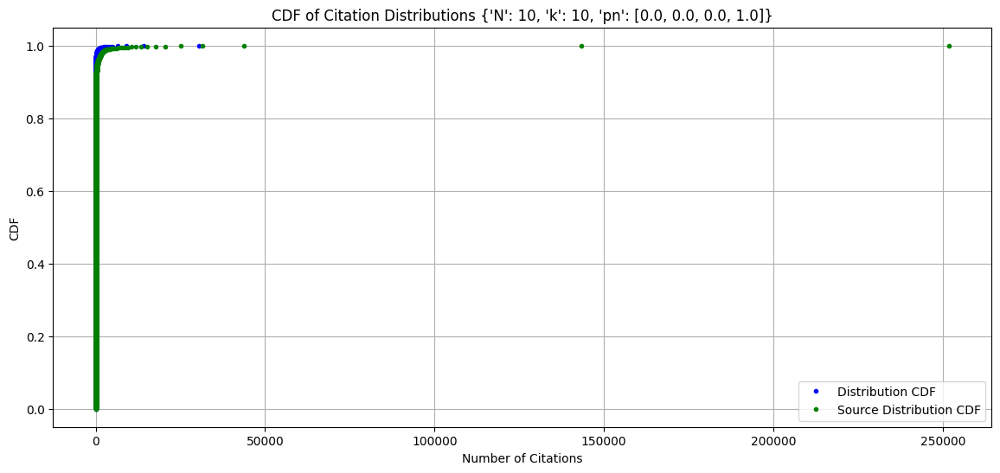

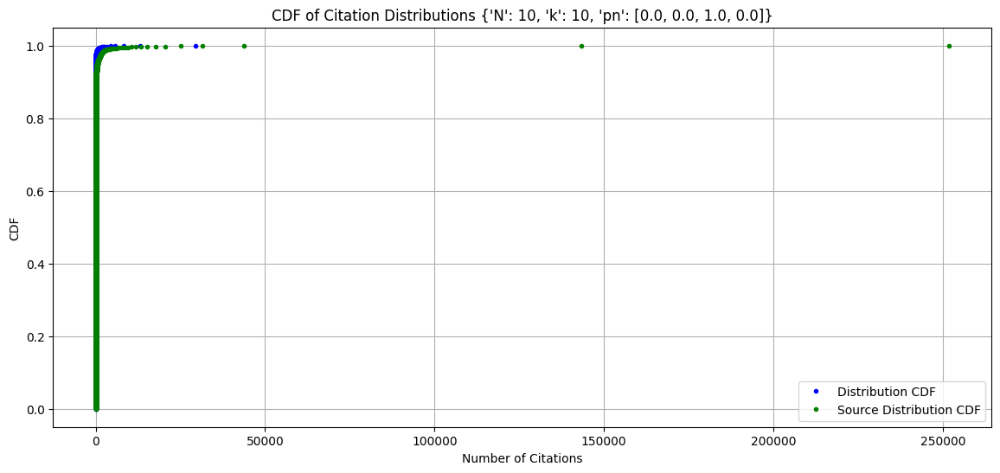

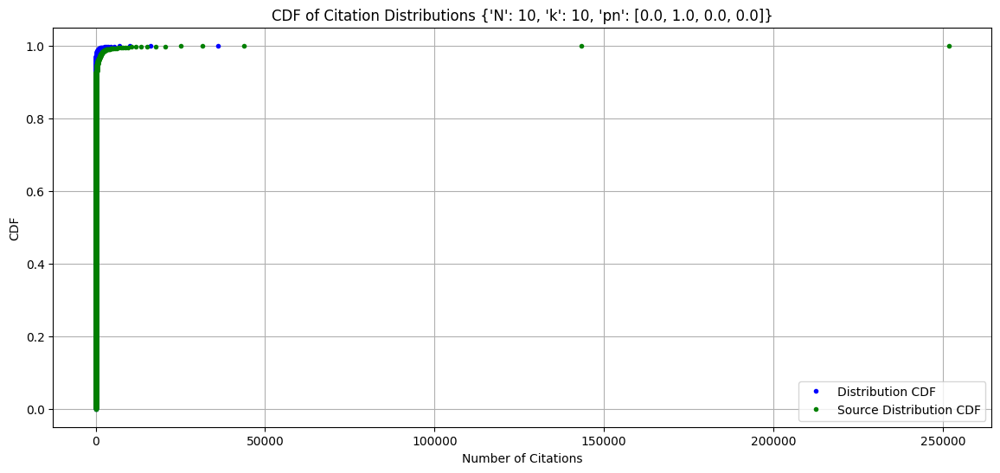

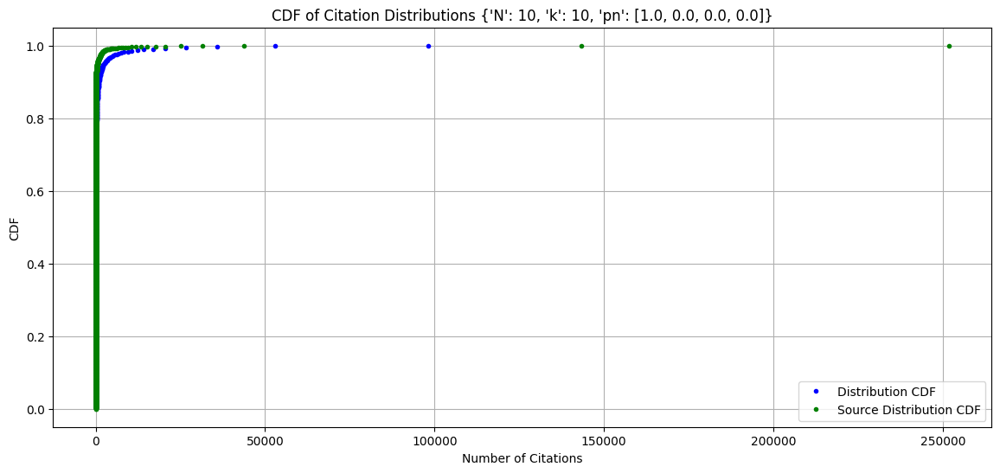

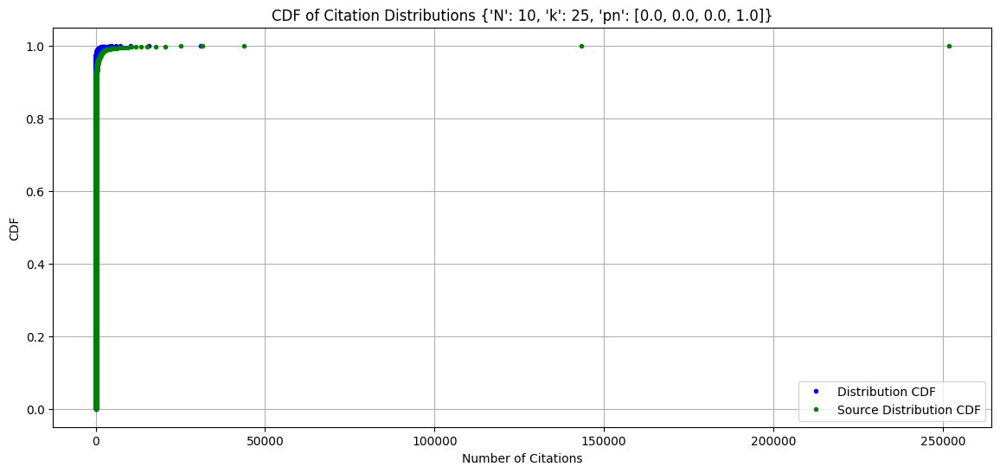

...

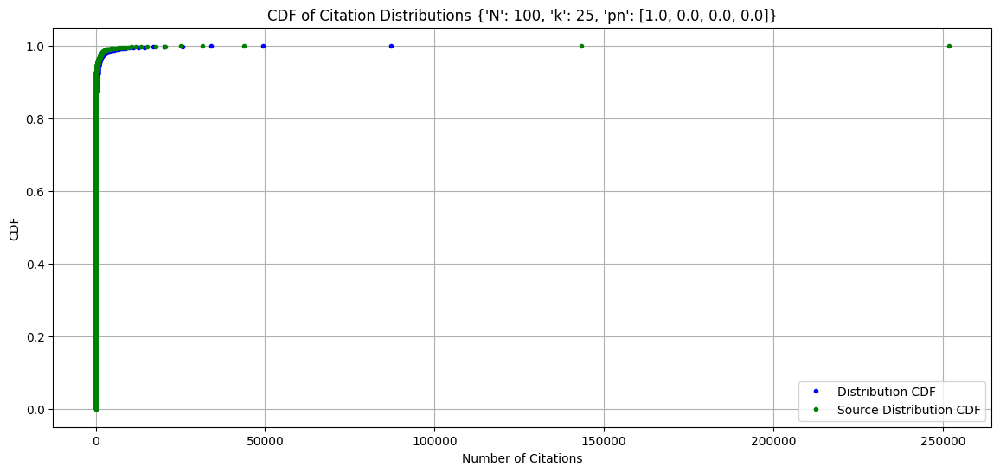

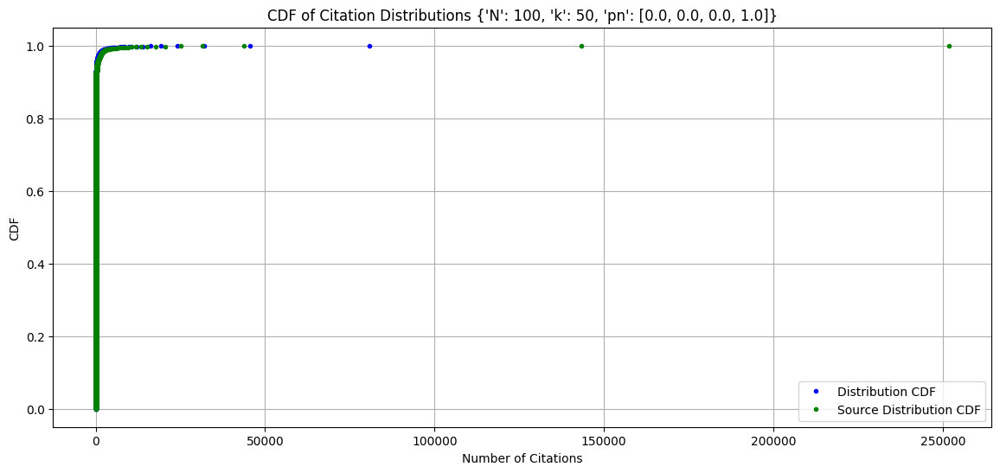

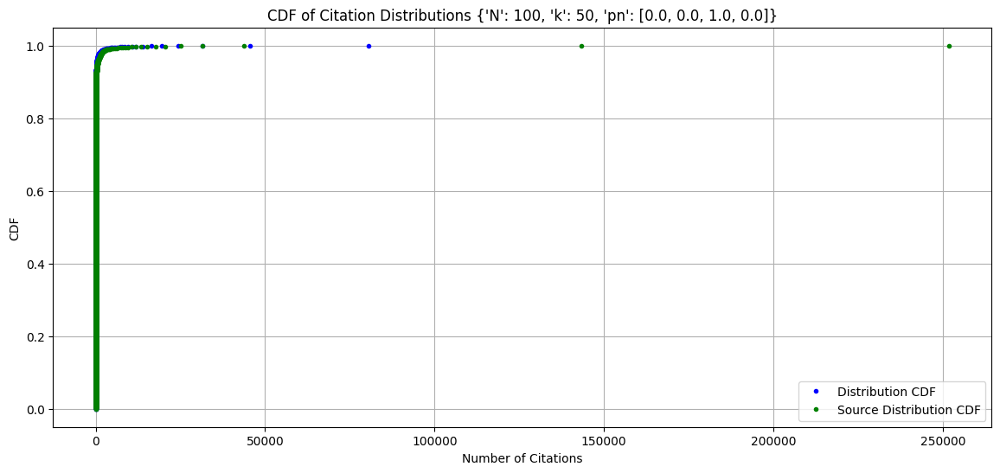

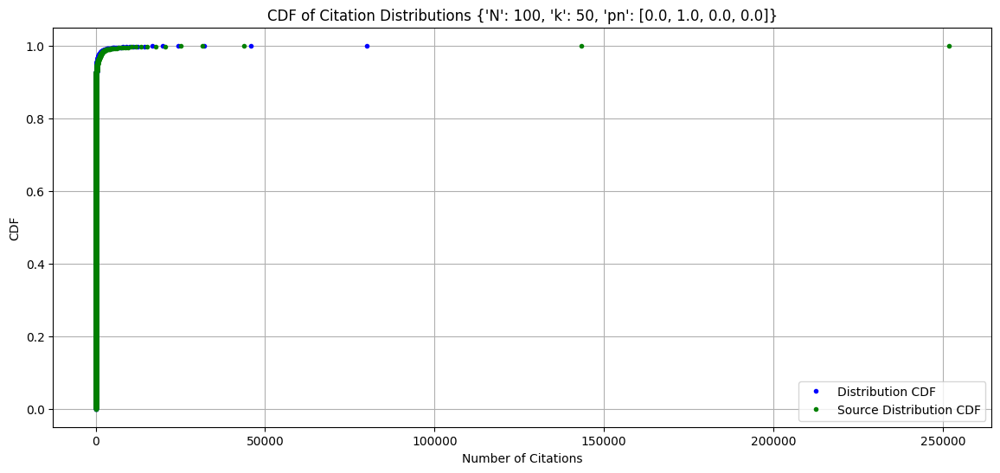

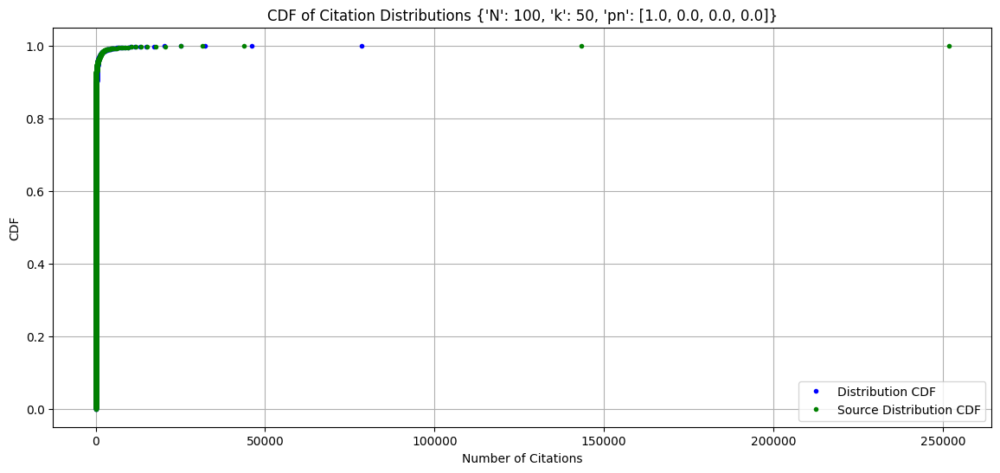

In [234]:
def plot_cdf(dist_citations_values, src_citations_values, title):
    # Sortowanie wartości
    dist_sorted = np.sort(dist_citations_values)
    src_sorted = np.sort(src_citations_values)
    
    # Obliczanie funkcji dystrybuanty
    dist_cdf = np.arange(1, len(dist_sorted) + 1) / len(dist_sorted)
    src_cdf = np.arange(1, len(src_sorted) + 1) / len(src_sorted)
    
    plt.figure(figsize=(14, 6))
    
    plt.plot(dist_sorted, dist_cdf, marker='.', linestyle='none', label='Distribution CDF', color='blue')
    plt.plot(src_sorted, src_cdf, marker='.', linestyle='none', label='Source Distribution CDF', color='green')
    
    plt.xlabel('Number of Citations')
    plt.ylabel('CDF')
    plt.title(f'CDF of Citation Distributions {title}')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

for index, row in filtered_df.iterrows():
    # Wyciąganie wartości distribution_citations
    dist_citations_values = list(row['distribution_citations'].values())
    
    # Wywołanie funkcji plot_cdf z wyodrębnionymi wartościami
    plot_cdf(dist_citations_values, list(source_distribution_citations.values()), str(row['settings']))

## Wyktrs potęgowy rozkłądu

C:\Users\user\AppData\Local\Temp\ipykernel_26164\567526762.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(60, 6))


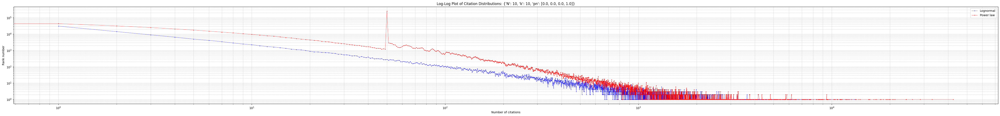

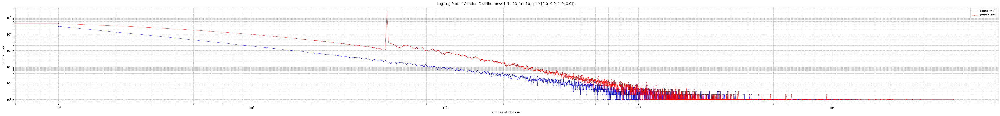

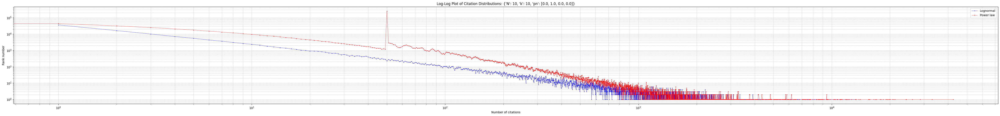

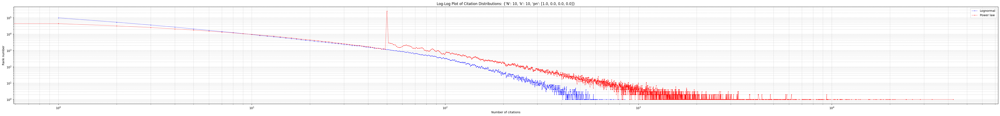

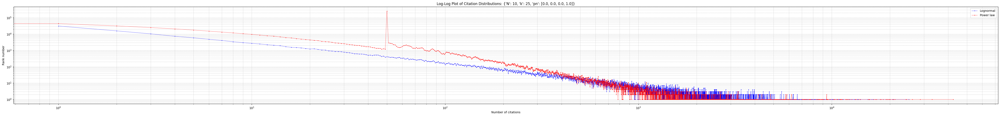

...

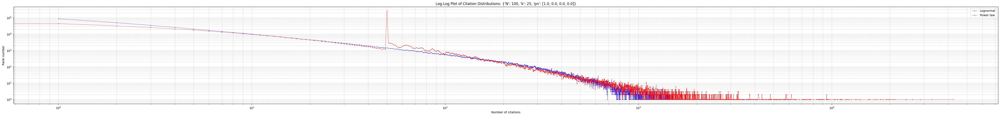

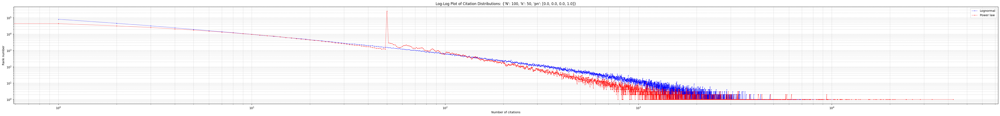

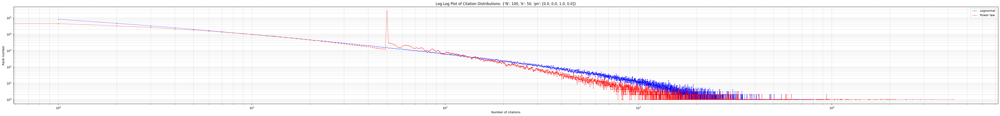

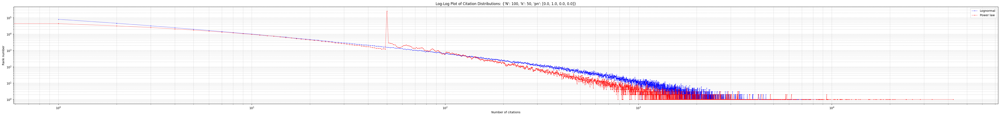

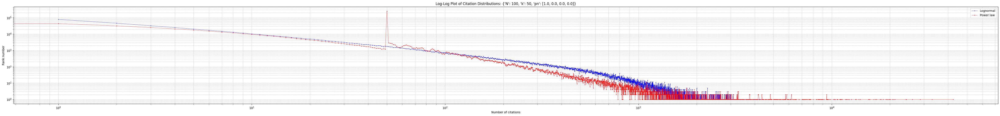

In [297]:
from matplotlib.backends.backend_pdf import PdfPages
for index, row in filtered_df.iterrows():
    # Wywołanie funkcji plot_cdf z wyodrębnionymi wartościami
    zipf_plot(list(row['distribution_citations'].items()), list(source_distribution_citations.items()), str(row['settings']))

In [315]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

def zipf_plot_full(distribution_citations_list, source_distribution_list, settings, pdf_pages, ks_value, p_value):
    # Tworzenie dataframe'ów z danych
    distribution_df = pd.DataFrame(distribution_citations_list, columns=['Citations', 'Count'])
    source_distribution_df = pd.DataFrame(source_distribution_list, columns=['Citations', 'Count'])
    
    # Sortowanie danych według liczby cytowań
    distribution_df = distribution_df.sort_values(by='Citations', ascending=True)
    source_distribution_df = source_distribution_df.sort_values(by='Citations', ascending=True)
    
    # Wykres log-log
    plt.figure(figsize=(35, 15))
    plt.loglog(distribution_df['Citations'], distribution_df['Count'], 
               marker='o', linestyle='-', color='blue', 
               linewidth=0.5,  # Ustawienie grubości linii
               markersize=1,    # Rozmiar kropek
               label='Lognormal')
    plt.loglog(source_distribution_df['Citations'], source_distribution_df['Count'], 
               marker='s', linestyle='-', color='red', 
               linewidth=0.5,  # Ustawienie grubości linii
               markersize=1,    # Rozmiar kropek
               label='Power law')

    plt.xlabel('Number of citations')
    plt.ylabel('Rank number')
    plt.title(f'Log-Log Plot of Citation Distributions: {settings}')
    plt.legend()

    # Dodanie dodatkowych informacji jako tekst na wykresie
    plt.text(0.05, 0.95, f'KS Statistic: {ks_value}\n'
                         f'p-value: {p_value}', 
             transform=plt.gca().transAxes,
             fontsize=12, 
             verticalalignment='top',
             bbox=dict(boxstyle='round', alpha=0.1, edgecolor='none', facecolor='lightgrey'))
    plt.grid(True, which="both", ls="--", linewidth=0.5)
    
    # Zapisanie wykresu do PDF
    pdf_pages.savefig(plt.gcf())
    plt.close()  # Zamknięcie wykresu

# Utworzenie obiektu PdfPages
with PdfPages('../zipf_plots_306.pdf') as pdf_pages:
    for index, row in distribution_df.iterrows():
        # Wywołanie funkcji z wyodrębnionymi wartościami
        zipf_plot_full(list(row['distribution_citations'].items()), 
                  list(source_distribution_citations.items()), 
                  str(row['settings']), 
                  pdf_pages,
                  row['KS Statistic'],
                  row['P-value']
                 )
